In [ ]:
import torch
torch.cuda.is_available()


True

In [ ]:
!mkdir -p /content/data
!unzip "/content/drive/MyDrive/Colab Notebooks/helmet-train-model/Bike Helmet Detection.v1-test.yolov8.zip" -d "/content/data/"


In [ ]:
!pip install ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 64.0 MB/s eta 0:00:00


In [ ]:
!ls "/content/data"


'Bike Helmet Detection.v1-test.yolov8'


In [ ]:
!ls "/content/data/Bike Helmet Detection.v1-test.yolov8"


data.yaml  README.dataset.txt  README.roboflow.txt  test  train  valid


In [ ]:
!pip install ultralytics


In [ ]:
from ultralytics import YOLO

model = YOLO("yolov8n.pt")

model.train(
    data="/content/data/Bike Helmet Detection.v1-test.yolov8/data.yaml",
    epochs=20,
    imgsz=640
)


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.3.228 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/data/Bike Helmet Detection.v1-test.yolov8/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=6

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7a290b2419d0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804

In [ ]:
from ultralytics import YOLO

model = YOLO("/content/runs/detect/train/weights/best.pt")

results = model.predict(
    source="/content/data/Bike Helmet Detection.v1-test.yolov8/valid/images",
    save=True
)



image 1/127 /content/data/Bike Helmet Detection.v1-test.yolov8/valid/images/BikesHelmets0_png_jpg.rf.cce93bc73760ab93c940fdebe2d6f2ea.jpg: 640x640 4 With Helmets, 7.3ms
image 2/127 /content/data/Bike Helmet Detection.v1-test.yolov8/valid/images/BikesHelmets104_png_jpg.rf.e60380bce429daace091f8750bc89aaa.jpg: 640x640 2 With Helmets, 18.3ms
image 3/127 /content/data/Bike Helmet Detection.v1-test.yolov8/valid/images/BikesHelmets105_png_jpg.rf.9e0b545cb322e504fb537a5c896a85f5.jpg: 640x640 1 With Helmet, 10.9ms
image 4/127 /content/data/Bike Helmet Detection.v1-test.yolov8/valid/images/BikesHelmets10_png_jpg.rf.d48b24d5fd802f36f8a1856b228d5e25.jpg: 640x640 1 Without Helmet, 14.1ms
image 5/127 /content/data/Bike Helmet Detection.v1-test.yolov8/valid/images/BikesHelmets117_png_jpg.rf.876b5354b3fbe2c1a31e43fce6d32407.jpg: 640x640 1 With Helmet, 22.5ms
image 6/127 /content/data/Bike Helmet Detection.v1-test.yolov8/valid/images/BikesHelmets119_png_jpg.rf.1887a9be3a21671c1086c78d7f166f47.jpg: 64

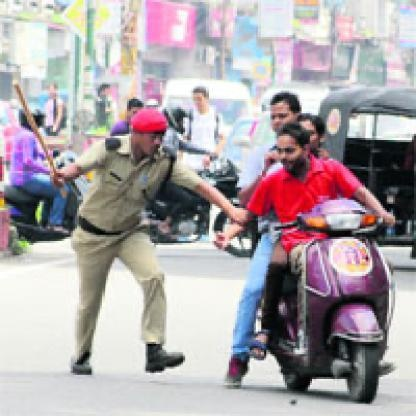

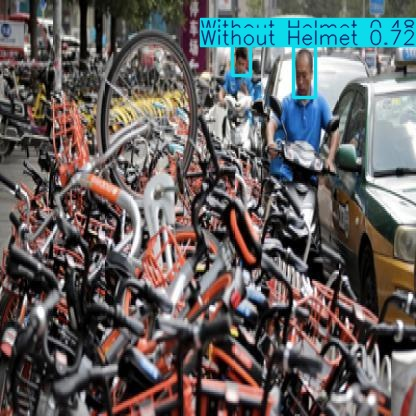

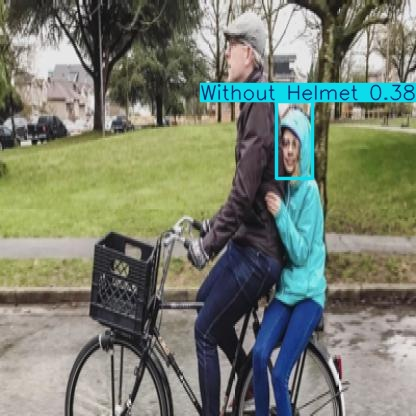

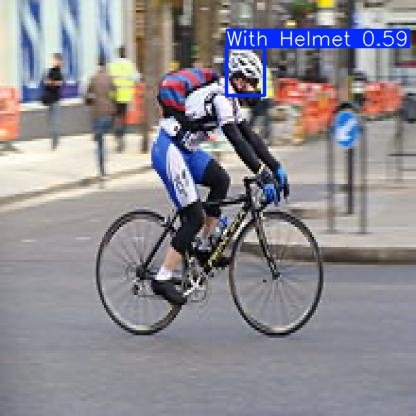

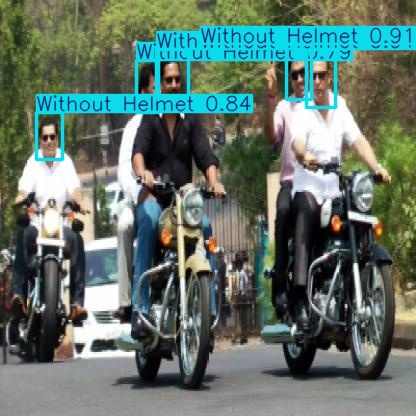

...

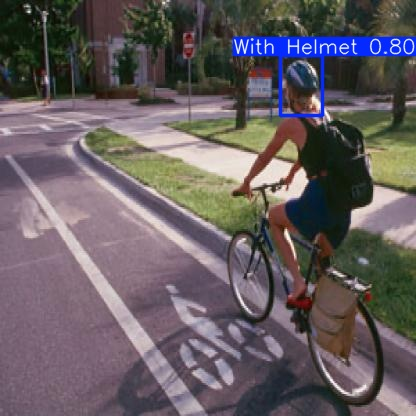

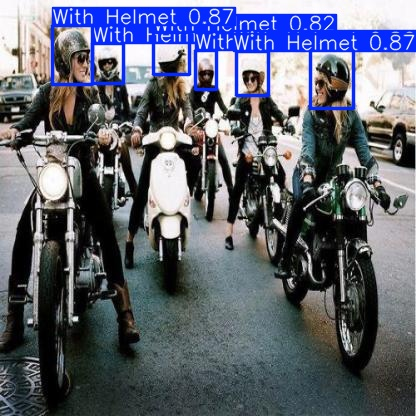

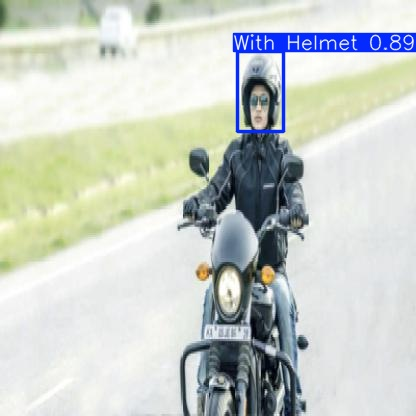

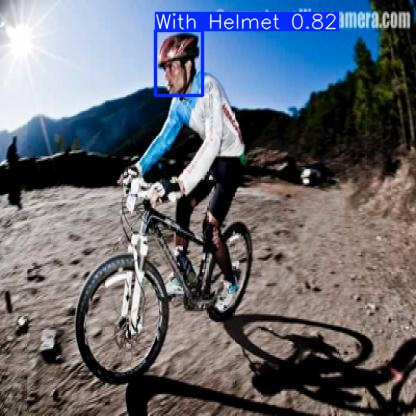

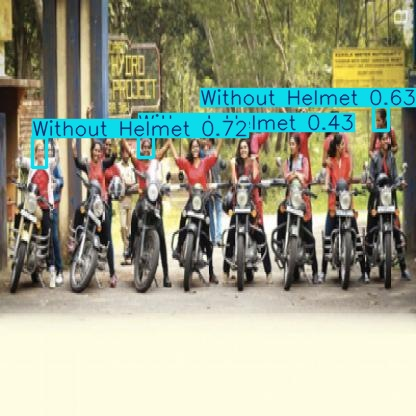

In [ ]:
import glob
from IPython.display import Image

for img in glob.glob("/content/runs/detect/predict/*.jpg"):
    display(Image(filename=img))


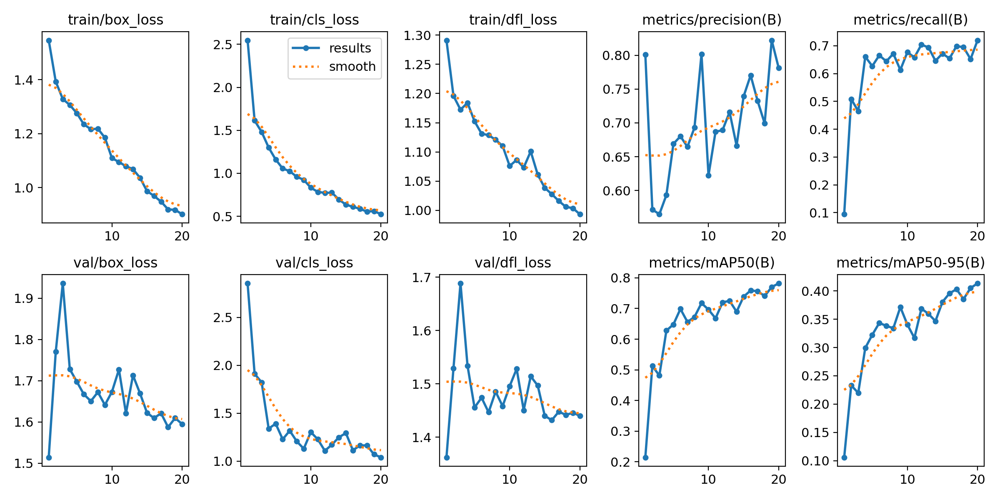

In [ ]:
from IPython.display import Image

Image(filename='/content/runs/detect/train/results.png')


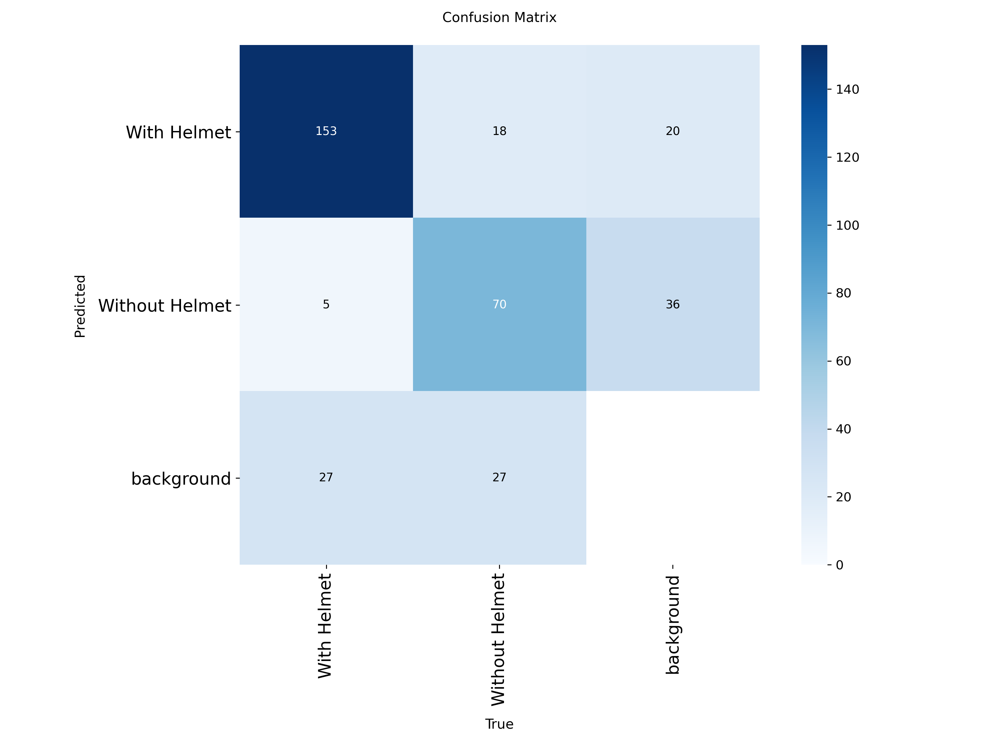

In [ ]:
Image(filename='/content/runs/detect/train/confusion_matrix.png')


In [ ]:
!cp -r /content/runs/detect/predict "/content/drive/MyDrive/helmet-results"
